In [2]:
import numpy as np
import matplotlib.pyplot as plt
import firtez_dz as frz
from astropy.io import fits
from matplotlib.colors import CenteredNorm, TwoSlopeNorm

In [3]:
plt.rc('text', usetex = False)

In [3]:
atm = frz.read_model('/dat/xenosh/muram_plage_pore/20000/out_muram_020000_nx192_ny192_nz120_dz12.bin')

In [ ]:
atm = frz.read_model('/dat/xenosh/muram_plage_pore/20000/bin_test2/2/out_out_muram_020000_nx192_ny192_nz120_dz12_smooth.bin')

In [49]:
atm = frz.read_model('/dat/xenosh/muram_plage_pore/20000/test4/2/out_out_valc_nx192_ny192_nz64_dz12.bin')

In [3]:
atm = frz.read_model('/dat/xenosh/muram_plage_pore/20000/psf/2/out_out_valc_nx192_ny192_nz64_dz12.bin')

## interp atm

In [4]:
# interpolate
tau_common = np.linspace(-3,1,41)
nx = atm.tem.shape[0]
ny = atm.tem.shape[1]
nz = tau_common.shape[0]
T= np.zeros((nx,ny,nz))
P= np.zeros((nx,ny,nz))
Bx= np.zeros((nx,ny,nz))
By= np.zeros((nx,ny,nz))
Bz= np.zeros((nx,ny,nz))
Vz= np.zeros((nx,ny,nz))
Bh = np.zeros((nx,ny,nz))
a = np.zeros((nz))
for i in range(nx):
    for j in range(ny):
        T[i,j,:] = np.interp(tau_common, atm.tau[i,j,::-1], atm.tem[i,j,::-1])
        a = np.interp(tau_common, atm.tau[i,j,::-1], np.log10(atm.pg[i,j,::-1]))
        P[i,j,:] = 10 ** a
        Bx[i,j,:] = np.interp(tau_common, atm.tau[i,j,::-1], atm.bx[i,j,::-1])
        By[i,j,:] = np.interp(tau_common, atm.tau[i,j,::-1], atm.by[i,j,::-1])
        Bz[i,j,:] = np.interp(tau_common, atm.tau[i,j,::-1], atm.bz[i,j,::-1])
        Vz[i,j,:] = np.interp(tau_common, atm.tau[i,j,::-1], atm.vz[i,j,::-1])
        Bh[i,j,:] = np.sqrt(Bx[i,j,:]**2+By[i,j,:]**2)

In [5]:
B = np.sqrt(Bz**2+Bh**2)

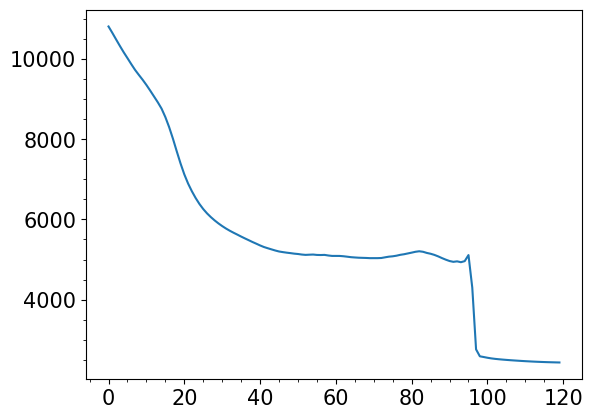

In [138]:
plt.plot(atm.tem[60,50,:])

Text(0.5, 1.0, '$\\log\\tau =-2$')

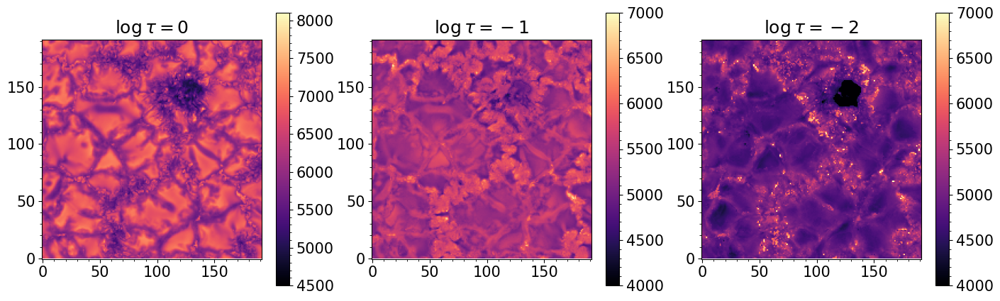

In [76]:
plt.figure(figsize=[17,5])
plt.subplot(131)
plt.imshow(T[:,:,30].T,cmap='magma',origin='lower',vmin=4500,vmax=8100)
plt.colorbar()
plt.title(r'$\log\tau =0$')
plt.subplot(132)
plt.imshow(T[:,:,20].T,cmap='magma',origin='lower',vmin=4000,vmax=7000)
plt.colorbar()
plt.title(r'$\log\tau =-1$')
plt.subplot(133)
plt.imshow(T[:,:,10].T,cmap='magma',origin='lower',vmin=4000,vmax=7000)
plt.colorbar()
plt.title(r'$\log\tau =-2$')

Text(0.5, 1.0, '$\\log\\tau =-2$')

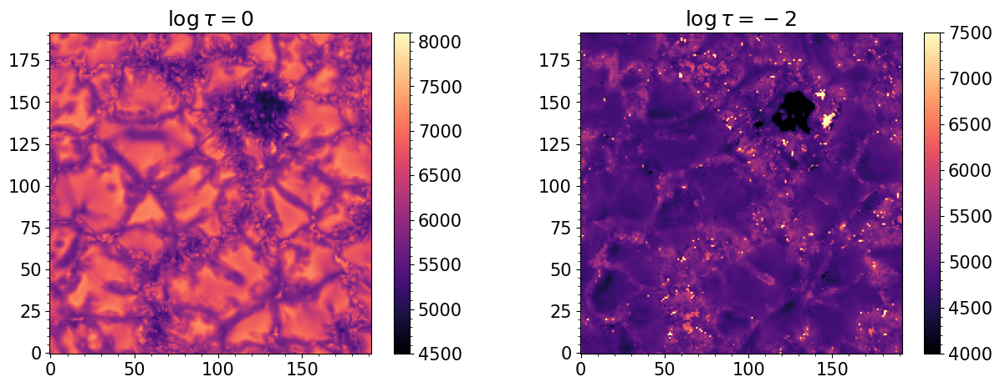

In [6]:
plt.figure(figsize=[15,5])
plt.subplot(121)
plt.imshow(T[:,:,30].T,cmap='magma',origin='lower',vmin=4500,vmax=8100)
plt.colorbar()
plt.title(r'$\log\tau =0$')
plt.subplot(122)
plt.imshow(T[:,:,10].T,cmap='magma',origin='lower',vmin=4000,vmax=7500)
plt.colorbar()
plt.title(r'$\log\tau =-2$')

Text(0.5, 1.0, '$\\log\\tau =-2$')

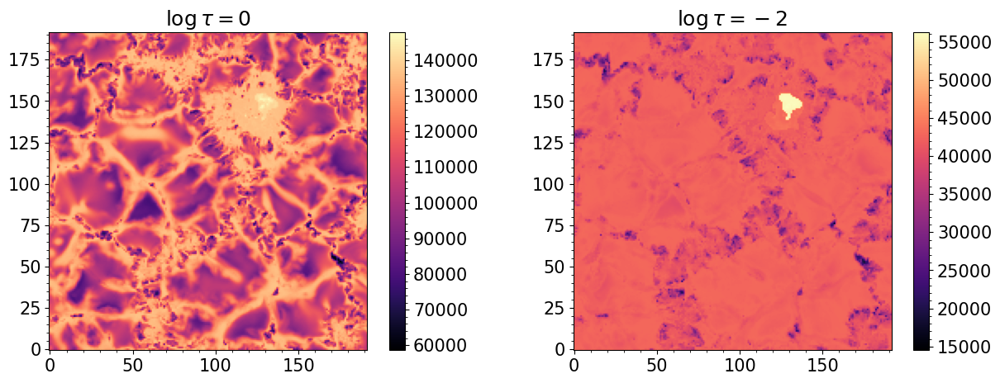

In [78]:
plt.figure(figsize=[15,5])
plt.subplot(121)
plt.imshow(P[:,:,30].T,cmap='magma',origin='lower')
plt.colorbar()
plt.title(r'$\log\tau =0$')
plt.subplot(122)
plt.imshow(P[:,:,20].T,cmap='magma',origin='lower')
plt.colorbar()
plt.title(r'$\log\tau =-2$')

Text(0.5, 1.0, '$\\log\\tau =-2$')

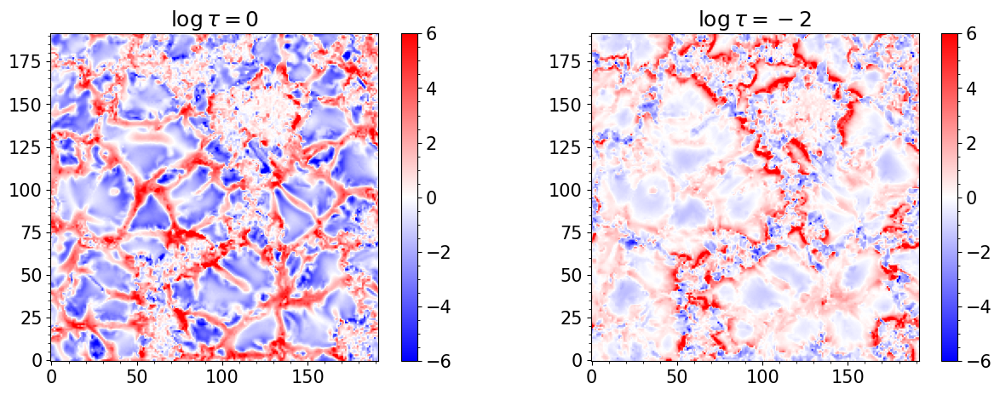

In [64]:
plt.figure(figsize=[15,5])
plt.subplot(121)
plt.imshow(Vz[:,:,30].T/1e5,cmap='bwr',origin='lower',vmin=-6,vmax=6)
plt.colorbar()
plt.title(r'$\log\tau =0$')
plt.subplot(122)
plt.imshow(Vz[:,:,10].T/1e5,cmap='bwr',origin='lower',vmin=-6,vmax=6)
plt.colorbar()
plt.title(r'$\log\tau =-2$')

Text(0.5, 1.0, '$\\log\\tau =-2$')

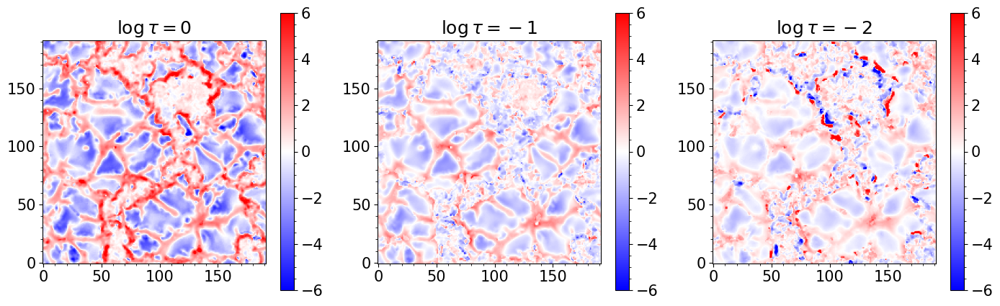

In [12]:
plt.figure(figsize=[17,5])
plt.subplot(131)
plt.imshow(Vz[:,:,30].T/1e5,cmap='bwr',origin='lower',vmin=-6,vmax=6)
plt.colorbar()
plt.title(r'$\log\tau =0$')
plt.subplot(132)
plt.imshow(Vz[:,:,20].T/1e5,cmap='bwr',origin='lower',vmin=-6,vmax=6)
plt.colorbar()
plt.title(r'$\log\tau =-1$')
plt.subplot(133)
plt.imshow(Vz[:,:,10].T/1e5,cmap='bwr',origin='lower',vmin=-6,vmax=6)
plt.colorbar()
plt.title(r'$\log\tau =-2$')

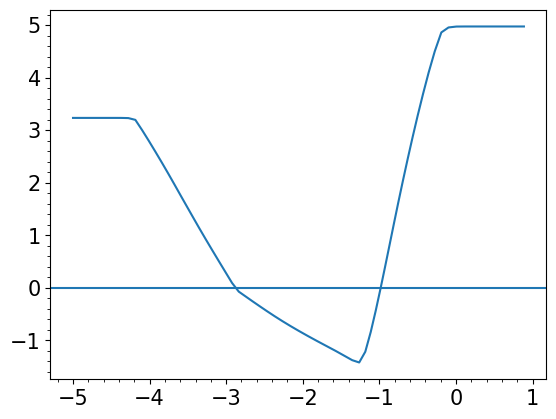

In [16]:
plt.plot(atm.tau[52,8,:],atm.vz[52,8,:]/1e5)
plt.axhline(0)

Text(0.5, 1.0, '$\\log\\tau =-2$')

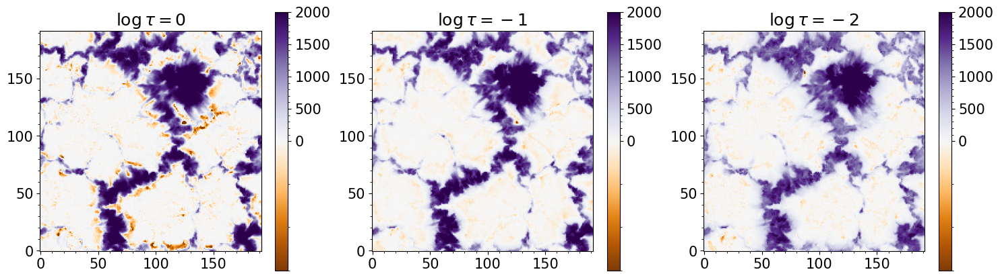

In [65]:
plt.figure(figsize=[18,5])
plt.subplot(131)
plt.imshow(Bz[:,:,30].T,cmap='PuOr',origin='lower', norm=TwoSlopeNorm(vmin=-300,vcenter=0,vmax=2000))
plt.colorbar()
plt.title(r'$\log\tau =0$')
plt.subplot(132)
plt.imshow(Bz[:,:,20].T,cmap='PuOr',origin='lower', norm=TwoSlopeNorm(vmin=-300,vcenter=0,vmax=2000))
plt.colorbar()
plt.title(r'$\log\tau =-1$')
plt.subplot(133)
plt.imshow(Bz[:,:,10].T,cmap='PuOr',origin='lower', norm=TwoSlopeNorm(vmin=-300,vcenter=0,vmax=2000))
plt.colorbar()
plt.title(r'$\log\tau =-2$')

Text(0.5, 1.0, '$\\log\\tau =-2$')

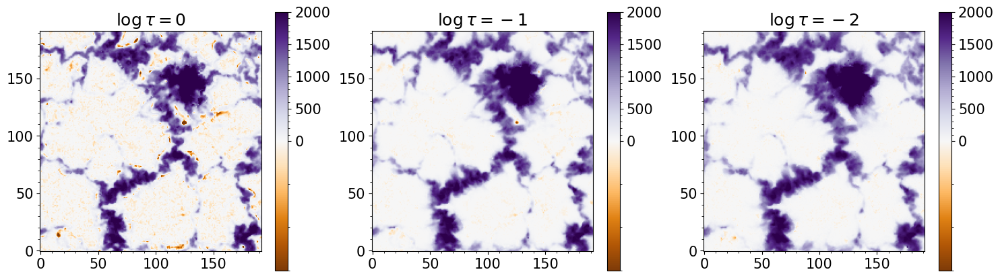

In [152]:
plt.figure(figsize=[18,5])
plt.subplot(131)
plt.imshow(Bz[:,:,30].T,cmap='PuOr',origin='lower', norm=TwoSlopeNorm(vmin=-300,vcenter=0,vmax=2000))
plt.colorbar()
plt.title(r'$\log\tau =0$')
plt.subplot(132)
plt.imshow(Bz[:,:,20].T,cmap='PuOr',origin='lower', norm=TwoSlopeNorm(vmin=-300,vcenter=0,vmax=2000))
plt.colorbar()
plt.title(r'$\log\tau =-1$')
plt.subplot(133)
plt.imshow(Bz[:,:,10].T,cmap='PuOr',origin='lower', norm=TwoSlopeNorm(vmin=-300,vcenter=0,vmax=2000))
plt.colorbar()
plt.title(r'$\log\tau =-2$')

In [26]:
c1 = Bz[:,:,30] > 1000
core = np.argwhere(c1)

In [27]:
core.shape

(6828, 2)

In [22]:
c = Bz[:,:,30] < -50
#c3 = Bz[:,:,20] <0
c2 = Bz[:,:,10] >300
oppo = np.argwhere(c & c2)

In [23]:
oppo.shape

(615, 2)

In [24]:
oppo.shape[0]/192/192

0.016682942708333332

In [41]:
192*192

36864

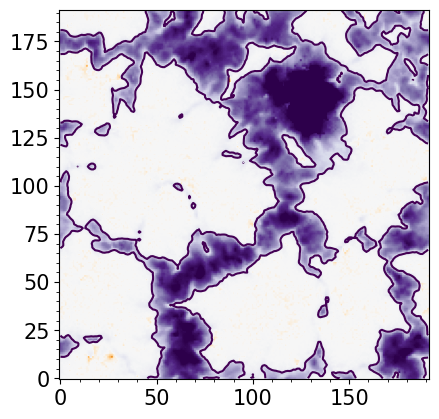

In [38]:
plt.imshow(Bz[:,:,10].T,cmap='PuOr',origin='lower', norm=TwoSlopeNorm(vmin=-300,vcenter=0,vmax=2000))
plt.contour(Bz[:,:,10].T,levels=[300])

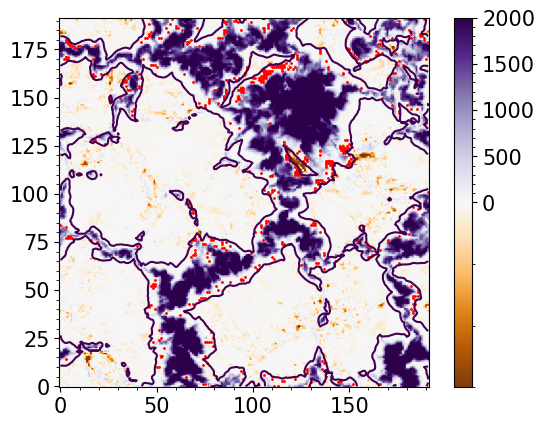

In [25]:
plt.imshow(Bz[:,:,30].T,cmap='PuOr',origin='lower', norm=TwoSlopeNorm(vmin=-300,vcenter=0,vmax=2000))
plt.colorbar()
plt.scatter(oppo[:,0],oppo[:,1],c='r',s=1)
plt.contour(Bz[:,:,10].T,levels=[300])

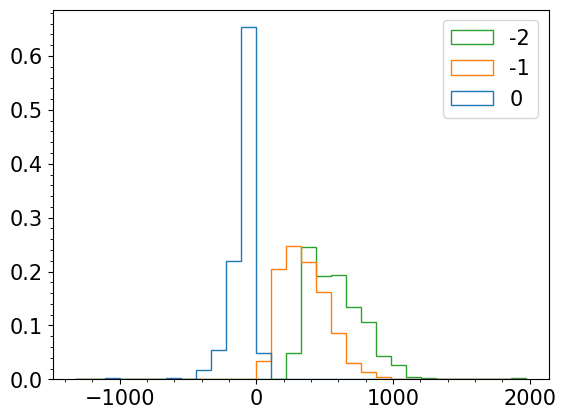

In [31]:
plt.hist([Bz[oppo[:,0],oppo[:,1],30].flatten(),Bz[oppo[:,0],oppo[:,1],20].flatten(),Bz[oppo[:,0],oppo[:,1],10].flatten()],bins=30,weights=[[1/oppo.shape[0]]*oppo.shape[0],[1/oppo.shape[0]]*oppo.shape[0],[1/oppo.shape[0]]*oppo.shape[0]],label=['0','-1','-2'],histtype='step')
#plt.ylim(top=0.15)
plt.legend()


Text(0.5, 1.0, '$\\log\\tau =-2$')

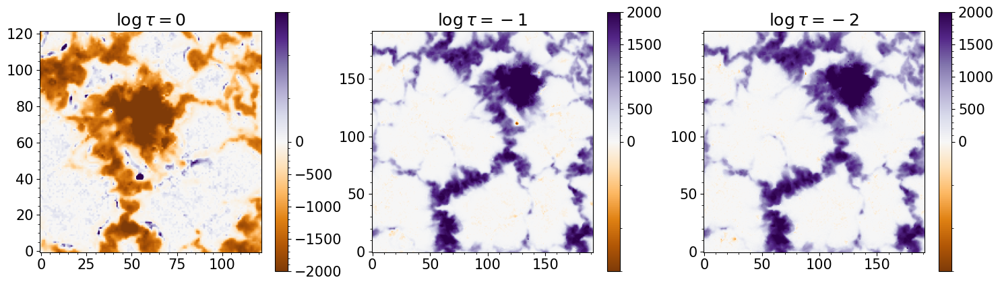

In [80]:
plt.figure(figsize=[18,5])
plt.subplot(131)
plt.imshow(-Bz[70:,70:,30].T,cmap='PuOr',origin='lower', norm=TwoSlopeNorm(vmin=-2000,vcenter=0,vmax=300))
plt.colorbar()
plt.title(r'$\log\tau =0$')
plt.subplot(132)
plt.imshow(Bz[:,:,20].T,cmap='PuOr',origin='lower', norm=TwoSlopeNorm(vmin=-300,vcenter=0,vmax=2000))
plt.colorbar()
plt.title(r'$\log\tau =-1$')
plt.subplot(133)
plt.imshow(Bz[:,:,10].T,cmap='PuOr',origin='lower', norm=TwoSlopeNorm(vmin=-300,vcenter=0,vmax=2000))
plt.colorbar()
plt.title(r'$\log\tau =-2$')

In [45]:
Bz[x,y,:]

array([  20.23244996,   18.2090836 ,   16.12143409,   13.98285253,
         11.69065475,    8.52480335,    3.35123491,   -3.84578658,
        -11.42515531,  -19.79535708,  -29.99075614,  -42.23985974,
        -56.79599136,  -72.70052571,  -88.28323656, -102.45215633,
       -113.69806307,  -87.16426597,  -49.50773261,  -13.29114872,
         21.70729907,   55.67770606,   88.63405629,  120.96810666,
        152.96068493,  184.49431325,  215.21863448,  244.87182647,
        272.69585211,  286.61957711,  288.43221115,  288.49560547,
        288.49560547,  288.49560547,  288.49560547,  288.49560547,
        288.49560547,  288.49560547,  288.49560547,  288.49560547,
        288.49560547])

Text(0.5, 1.0, '$\\log\\tau =-2$')

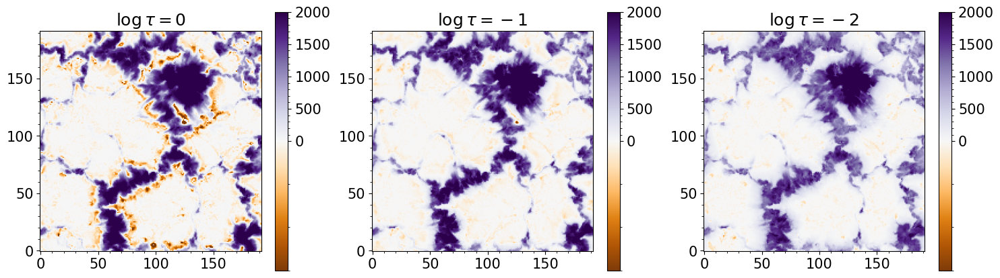

In [ ]:
plt.figure(figsize=[18,5])
plt.subplot(131)
plt.imshow(Bz[:,:,30].T,cmap='PuOr',origin='lower', norm=TwoSlopeNorm(vmin=-300,vcenter=0,vmax=2000))
plt.colorbar()
plt.title(r'$\log\tau =0$')
plt.subplot(132)
plt.imshow(Bz[:,:,20].T,cmap='PuOr',origin='lower', norm=TwoSlopeNorm(vmin=-300,vcenter=0,vmax=2000))
plt.colorbar()
plt.title(r'$\log\tau =-1$')
plt.subplot(133)
plt.imshow(Bz[:,:,10].T,cmap='PuOr',origin='lower', norm=TwoSlopeNorm(vmin=-300,vcenter=0,vmax=2000))
plt.colorbar()
plt.title(r'$\log\tau =-2$')

Text(0.5, 1.0, '$\\log\\tau =-2$')

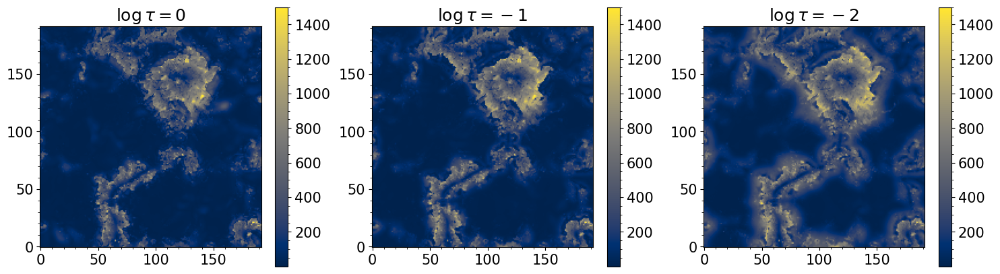

In [ ]:
plt.figure(figsize=[18,5])
plt.subplot(131)
plt.imshow(Bh[:,:,30].T,cmap='cividis',origin='lower', vmax=1500)
plt.colorbar()
plt.title(r'$\log\tau =0$')
plt.subplot(132)
plt.imshow(Bh[:,:,20].T,cmap='cividis',origin='lower', vmax=1500)
plt.colorbar()
plt.title(r'$\log\tau =-1$')
plt.subplot(133)
plt.imshow(Bh[:,:,10].T,cmap='cividis',origin='lower', vmax=1500)
plt.colorbar()
plt.title(r'$\log\tau =-2$')

Text(0.5, 1.0, '$\\log\\tau =-2$')

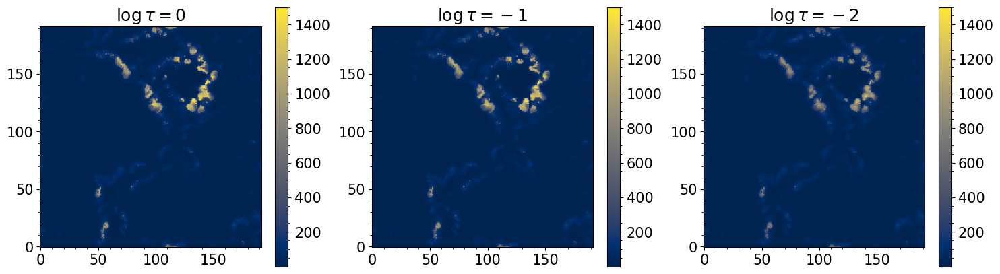

In [55]:
plt.figure(figsize=[18,5])
plt.subplot(131)
plt.imshow(Bh[:,:,30].T,cmap='cividis',origin='lower', vmax=1500)
plt.colorbar()
plt.title(r'$\log\tau =0$')
plt.subplot(132)
plt.imshow(Bh[:,:,20].T,cmap='cividis',origin='lower', vmax=1500)
plt.colorbar()
plt.title(r'$\log\tau =-1$')
plt.subplot(133)
plt.imshow(Bh[:,:,10].T,cmap='cividis',origin='lower', vmax=1500)
plt.colorbar()
plt.title(r'$\log\tau =-2$')

In [55]:
inc = np.arctan2(Bh[:,:,:],Bz[:,:,:])*180/np.pi

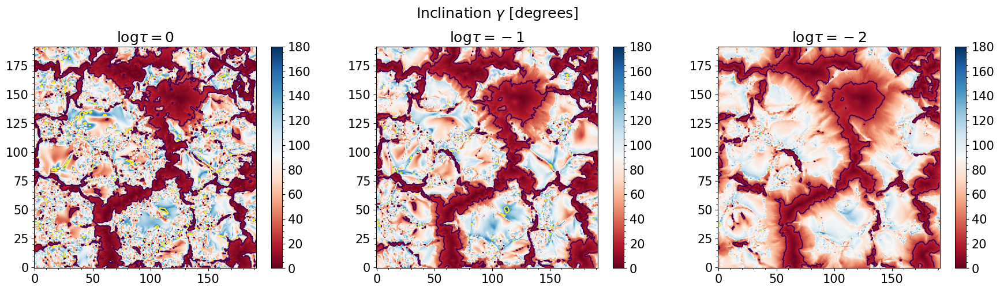

In [56]:
plt.figure(figsize=(18,5))
plt.subplot(131)
plt.imshow(inc[:,:,30].T,vmin=0,vmax=180,origin='lower',cmap='RdBu')
plt.title(r'log$\tau=0$')
plt.colorbar()
#plt.ylabel('y [arcsec]')
#plt.xlabel('x [arcsec]')
plt.contour(inc[:,:,30].T,levels=[25,155])
plt.subplot(132)
plt.imshow(inc[:,:,20].T,vmin=0,vmax=180,origin='lower',cmap='RdBu')
plt.title(r'log$\tau=-1$')
plt.colorbar()
#plt.ylabel('y [arcsec]')
#plt.xlabel('x [arcsec]')
plt.contour(inc[:,:,20].T,levels=[25,155])
plt.subplot(133)
plt.imshow(inc[:,:,10].T,vmin=0,vmax=180,origin='lower',cmap='RdBu')
plt.title(r'log$\tau=-2$')
plt.colorbar()
#plt.ylabel('y [arcsec]')
#plt.xlabel('x [arcsec]')
plt.contour(inc[:,:,10].T,levels=[25,155])
plt.suptitle(r'Inclination $\gamma$ [degrees]')
plt.tight_layout()

## chi2

In [5]:
def chi2(stokes,syn):
    noise = 1e-2
    chi2 = np.zeros((192,192))
    for x in range(192):
        for y in range(192):
            chi2[x,y]= np.sum(((stokes.stki[:,x,y]-syn.stki[:,x,y])**2)+((stokes.stkq[:,x,y]-syn.stkq[:,x,y])**2)+((stokes.stku[:,x,y]-syn.stku[:,x,y])**2)+((stokes.stkv[:,x,y]-syn.stkv[:,x,y])**2)) /((noise)**2)/800
    return chi2

In [29]:
stokes = frz.read_profile('/dat/xenosh/muram_plage_pore/20000/stokes_bin.bin')

In [4]:
stok = frz.read_profile('/dat/xenosh/muram_plage_pore/20000/stokes.bin')

In [21]:
stokes1 = frz.read_profile('/dat/xenosh/muram_plage_pore/20000/test3/stokes_bin_noise0.01.bin')

In [82]:
stokes = frz.read_profile('/dat/xenosh/muram_plage_pore/20000/psf/psf_bin_noise0.01.bin')

In [6]:
syn = frz.read_profile('/dat/xenosh/muram_plage_pore/20000/psf/2/out_psf_bin_noise0.01.bin')

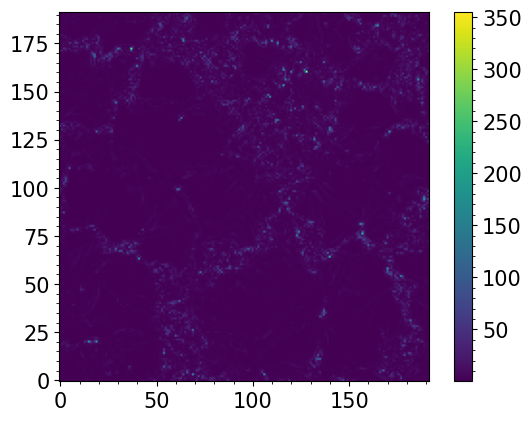

In [10]:
plt.imshow(chi2(stok,syn).T,origin='lower')
plt.colorbar()

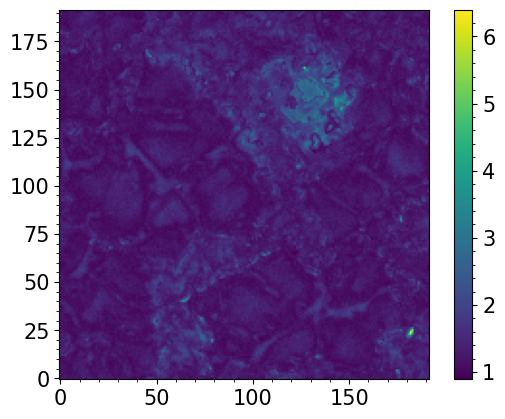

In [11]:
plt.imshow(chi2(stokes,syn).T,origin='lower')
plt.colorbar()

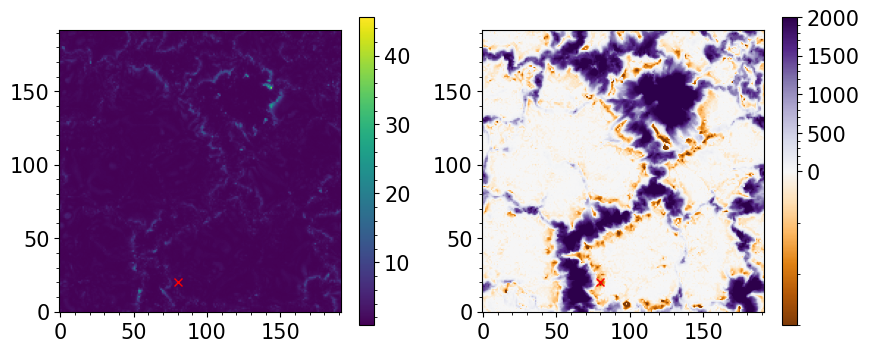

In [26]:
plt.figure(figsize=(10,4))
plt.subplot(121)
plt.imshow(chi2(stokes,syn).T,origin='lower')
plt.colorbar()
plt.plot(x,y,c='r',marker='x')
plt.subplot(122)
plt.imshow(Bz[:,:,30].T,cmap='PuOr',origin='lower', norm=TwoSlopeNorm(vmin=-300,vcenter=0,vmax=2000))
plt.colorbar()
plt.plot(x,y,c='r',marker='x')

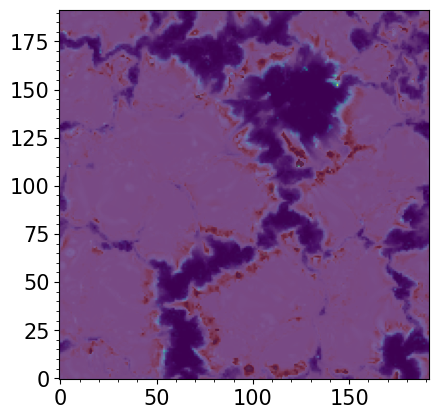

In [22]:
plt.imshow(chi2(stokes,syn).T,origin='lower')
plt.imshow(Bz[:,:,30].T,cmap='PuOr',origin='lower', norm=TwoSlopeNorm(vmin=-300,vcenter=0,vmax=2000),alpha=0.3)

In [23]:
np.mean(chi2(stokes,syn))

68.66903831862538

In [24]:
chi2(stokes,syn)[x,y]

146.41089284169047

In [17]:
stokes_noise = stokes.stkv + np.random.normal(loc=0, scale=1e-2, size=stokes.shape)

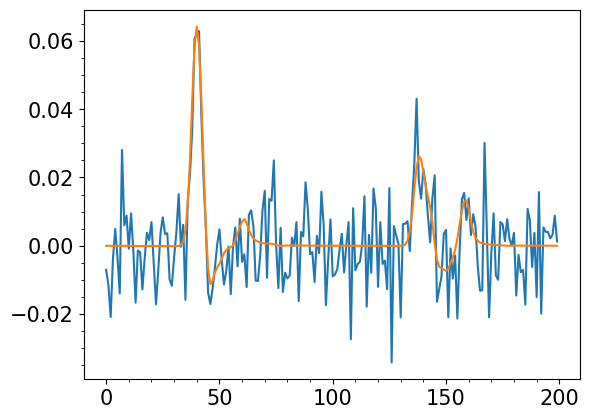

In [18]:
plt.plot(stokes_noise[:,x,y])
plt.plot(stokes.stkv[:,x,y])

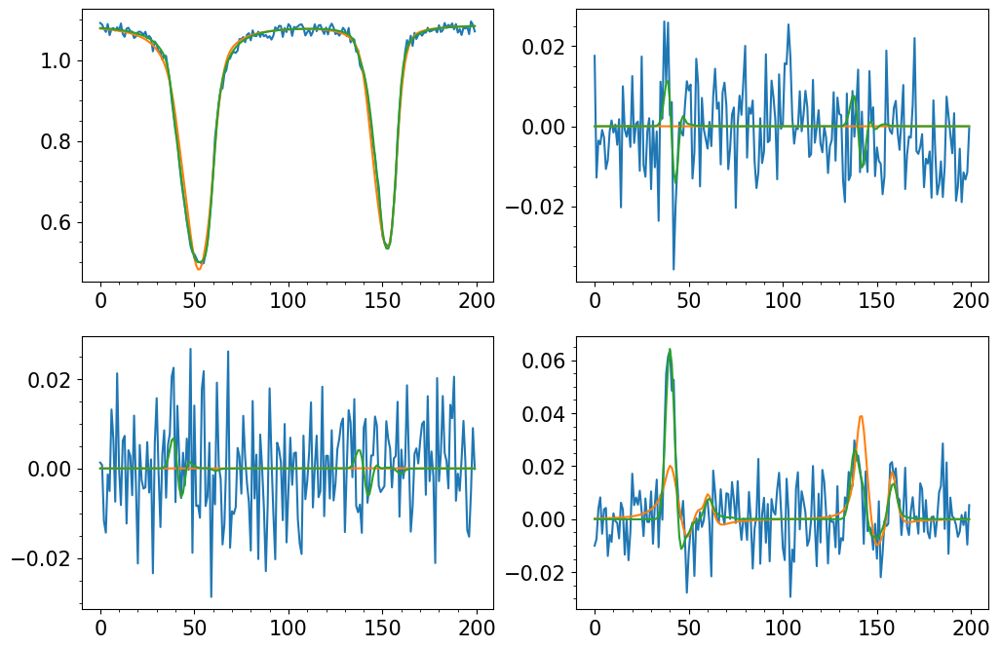

In [40]:
x = 80
y = 20
plt.figure(figsize=(12,8))
plt.subplot(221)
plt.plot(stokes.stki[:,x,y])
plt.plot(syn.stki[:,x,y])
plt.plot(stok.stki[:,x,y])
plt.subplot(222)
plt.plot(stokes.stkq[:,x,y])
plt.plot(syn.stkq[:,x,y])
plt.plot(stok.stkq[:,x,y])
plt.subplot(223)
plt.plot(stokes.stku[:,x,y])
plt.plot(syn.stku[:,x,y])
plt.plot(stok.stku[:,x,y])
plt.subplot(224)
plt.plot(stokes.stkv[:,x,y])
plt.plot(syn.stkv[:,x,y])
plt.plot(stok.stkv[:,x,y])

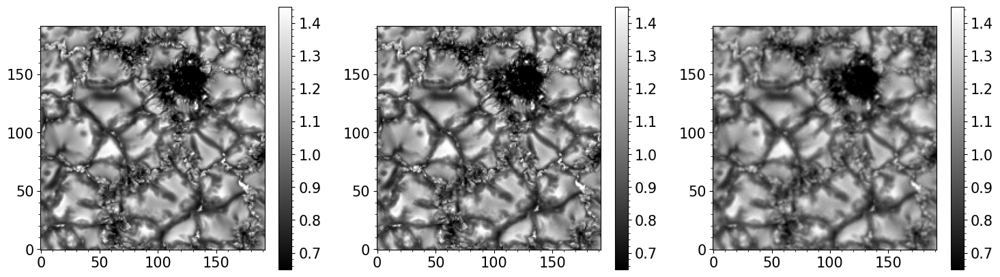

In [59]:
plt.figure(figsize=(18,5))
plt.subplot(131)
plt.imshow(stok.stki[100,:,:].T,origin='lower',cmap='gray',vmin=0.65,vmax=1.45)
plt.colorbar()
plt.subplot(132)
plt.imshow(stokes1.stki[100,:,:].T,origin='lower',cmap='gray',vmin=0.65,vmax=1.45)
plt.colorbar()
plt.subplot(133)
plt.imshow(stokes.stki[100,:,:].T,origin='lower',cmap='gray',vmin=0.65,vmax=1.45)
plt.colorbar()

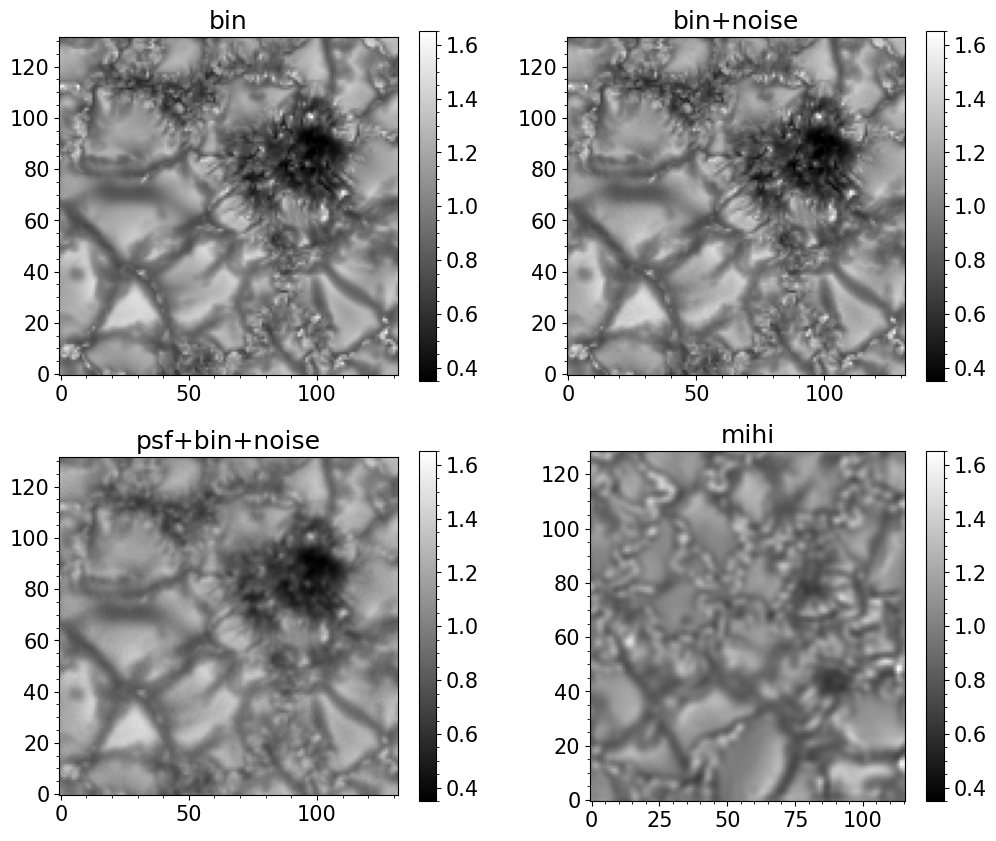

In [9]:
plt.figure(figsize=(12,10))
plt.subplot(221)
plt.imshow(stok.stki[100,30:-30,60:].T,origin='lower',cmap='gray',vmin=0.35,vmax=1.65)
plt.title('bin')
plt.colorbar()
plt.subplot(222)
plt.imshow(stokes1.stki[100,30:-30,60:].T,origin='lower',cmap='gray',vmin=0.35,vmax=1.65)
plt.title('bin+noise')
plt.colorbar()
plt.subplot(223)
plt.imshow(stokes.stki[100,30:-30,60:].T,origin='lower',cmap='gray',vmin=0.35,vmax=1.65)
plt.title('psf+bin+noise')
plt.colorbar()
plt.subplot(224)
plt.imshow(np.mean(test.stki[185:195,:,:],axis=0).T,origin='lower',cmap='gray',vmin=0.35,vmax=1.65)
plt.title('mihi')
plt.colorbar()

In [75]:
print(np.std(np.mean(stok.stki[95:105,:,:],axis=0)))
print(np.std(np.mean(stokes1.stki[95:105,:,:],axis=0)))
print(np.std(np.mean(stokes.stki[95:105,:,:],axis=0)))

0.18129870206080634
0.18135114171673652
0.1616735479691147


In [74]:
print(np.std(np.mean(test.stki[185:190,:,:],axis=0)))

0.12879684717771145


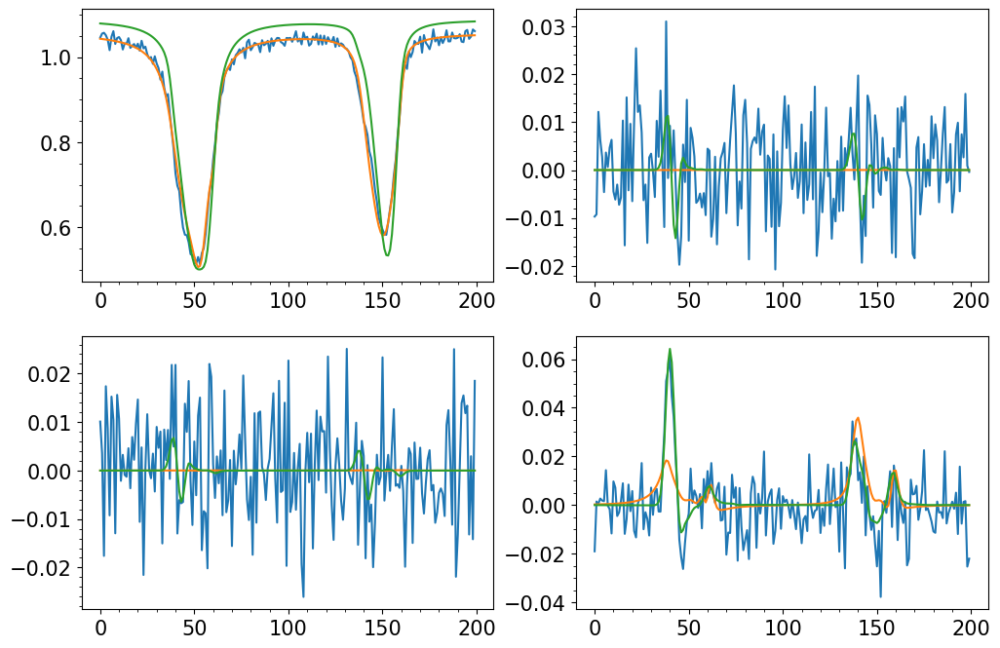

In [12]:
x = 80
y = 20
plt.figure(figsize=(12,8))
plt.subplot(221)
plt.plot(stokes.stki[:,x,y])
plt.plot(syn.stki[:,x,y])
plt.plot(stok.stki[:,x,y])
plt.subplot(222)
plt.plot(stokes.stkq[:,x,y])
plt.plot(syn.stkq[:,x,y])
plt.plot(stok.stkq[:,x,y])
plt.subplot(223)
plt.plot(stokes.stku[:,x,y])
plt.plot(syn.stku[:,x,y])
plt.plot(stok.stku[:,x,y])
plt.subplot(224)
plt.plot(stokes.stkv[:,x,y])
plt.plot(syn.stkv[:,x,y])
plt.plot(stok.stkv[:,x,y])

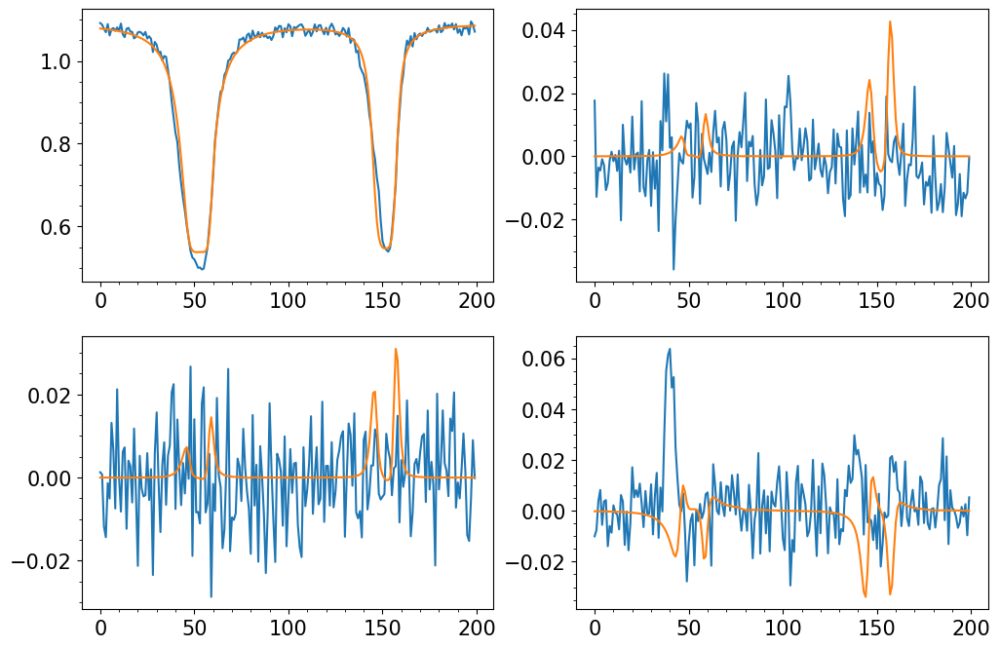

In [ ]:
x = 80
y = 20
plt.figure(figsize=(12,8))
plt.subplot(221)
plt.plot(stokes.stki[:,x,y])
plt.plot(syn.stki[:,x,y])
plt.subplot(222)
plt.plot(stokes.stkq[:,x,y])
plt.plot(syn.stkq[:,x,y])
plt.subplot(223)
plt.plot(stokes.stku[:,x,y])
plt.plot(syn.stku[:,x,y])
plt.subplot(224)
plt.plot(stokes.stkv[:,x,y])
plt.plot(syn.stkv[:,x,y])

## B vs Ic

In [146]:
B = np.sqrt(Bz**2+Bh**2)

Text(0, 0.5, 'Intensity [Ic]')

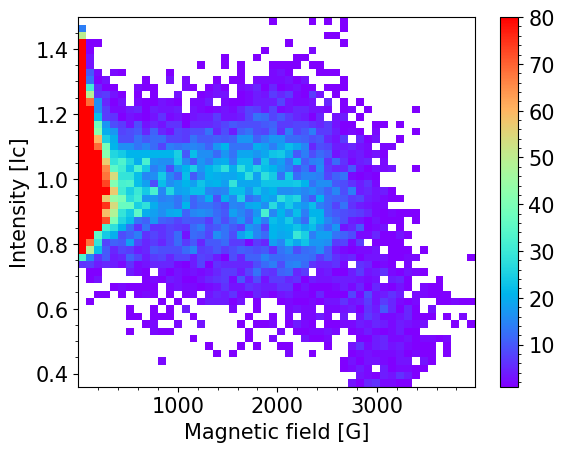

In [149]:
hist, xedges, yedges = np.histogram2d(B[:,:,30].flatten(),np.mean(stokes.stki[190:200,:,:],axis=0).flatten(),bins=50)
mask = np.ma.masked_where(hist ==0, hist)
cmap = plt.cm.rainbow
cmap.set_bad(color='white')
fig, ax = plt.subplots()
mesh = ax.pcolormesh(xedges, yedges, mask.T, cmap=cmap,vmax=80)

plt.colorbar(mesh, ax=ax)
plt.xlabel('Magnetic field [G]')
plt.ylabel('Intensity [Ic]')

In [26]:
atm = frz.read_model('/dat/xenosh/muram_plage_pore/20000/bin_test/muram_020000_nx192_ny192_nz120_dz12_smooth.bin')

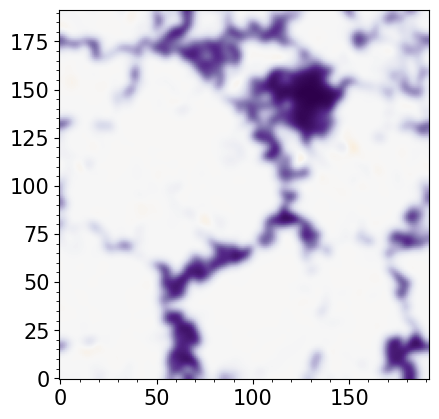

In [39]:
plt.imshow(atm.bz[:,:,30].T,origin='lower',cmap='PuOr',norm=CenteredNorm())

In [28]:
np.mean(atm.tau,axis=(0,1))

array([ 4.11535659,  4.07136788,  4.02607441,  3.97968275,  3.93217859,
        3.88347312,  3.83343023,  3.7818664 ,  3.72853496,  3.6730825 ,
        3.61504315,  3.55485029,  3.49343896,  3.43078292,  3.36686028,
        3.3016562 ,  3.23518425,  3.16749944,  3.09869859,  3.02891341,
        2.95830288,  2.88702897,  2.81523363,  2.74303776,  2.67057403,
        2.59797542,  2.52536195,  2.45284544,  2.3804989 ,  2.30833437,
        2.23602013,  2.1625767 ,  2.08728173,  2.01002444,  1.93069683,
        1.84918086,  1.76530647,  1.67879613,  1.58925664,  1.4962641 ,
        1.39939768,  1.29824445,  1.19241539,  1.08156664,  0.96544317,
        0.84382323,  0.71636395,  0.58258588,  0.44226383,  0.29586975,
        0.14445104, -0.01045113, -0.16588157, -0.31701923, -0.45840322,
       -0.58633289, -0.70097043, -0.80558171, -0.90402783, -0.99918373,
       -1.09283268, -1.18610153, -1.27968845, -1.37404807, -1.46949747,
       -1.56621678, -1.66434442, -1.76404268, -1.86565939, -1.96

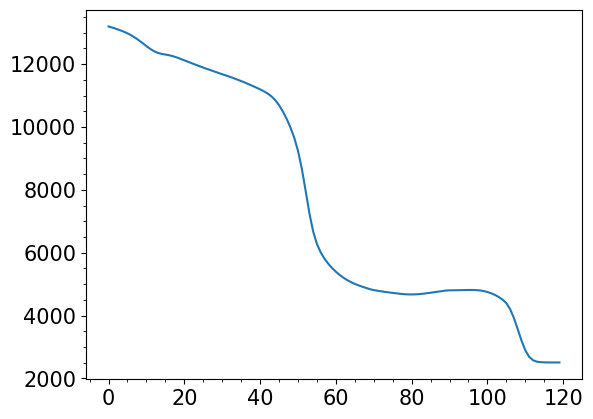

In [29]:
plt.plot(atm.tem[10,10,:])

In [145]:
np.std(stokes.stki[100,:,:])

0.1618267902623551

## atlas

In [4]:
mean = np.mean(stok.stki[100,:,:])

In [5]:
mean

1.0261030871601582

In [6]:
txt = np.loadtxt('/home/xenosh/codes/data/SolarSpectrumDB.php.txt', skiprows=1,delimiter=',',usecols=(0,1))

In [7]:
txt[:,1] /= np.mean(txt[:10,1]) 

In [10]:
ll = (test.wave/1000.0+6301.5)

In [109]:
test = frz.read_profile('/dat/xenosh/sharing/TimeSeries/20/stokes.bin')

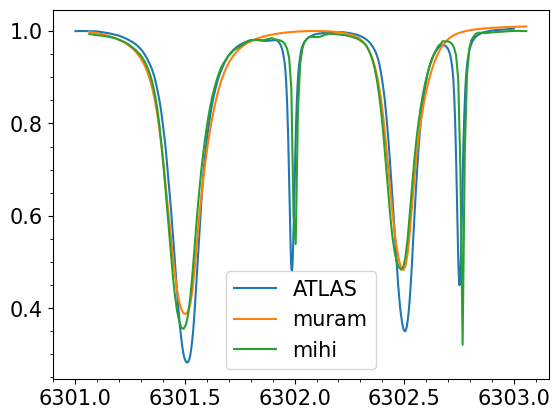

In [11]:
plt.plot(txt[:,0],txt[:,1],label='ATLAS')
plt.plot(ll,np.mean(stok.stki[:,:,:],axis=(1,2))/mean,label='muram')
plt.plot(ll,np.mean(test.stki[:,:,:],axis=(1,2)),label='mihi')
plt.legend()

## filtering

In [8]:
test = np.fft.fft2(stok.stki[100,:,:])
test = np.fft.fftshift(test)

In [12]:
test[0,0]

(5.420147120952608-4.440892098500626e-16j)

In [16]:
inv_x = np.fft.fftfreq(stok.shape[0])
inv_x = np.fft.fftshift(inv_x)

In [17]:
inv_x

array([-0.5  , -0.495, -0.49 , -0.485, -0.48 , -0.475, -0.47 , -0.465,
       -0.46 , -0.455, -0.45 , -0.445, -0.44 , -0.435, -0.43 , -0.425,
       -0.42 , -0.415, -0.41 , -0.405, -0.4  , -0.395, -0.39 , -0.385,
       -0.38 , -0.375, -0.37 , -0.365, -0.36 , -0.355, -0.35 , -0.345,
       -0.34 , -0.335, -0.33 , -0.325, -0.32 , -0.315, -0.31 , -0.305,
       -0.3  , -0.295, -0.29 , -0.285, -0.28 , -0.275, -0.27 , -0.265,
       -0.26 , -0.255, -0.25 , -0.245, -0.24 , -0.235, -0.23 , -0.225,
       -0.22 , -0.215, -0.21 , -0.205, -0.2  , -0.195, -0.19 , -0.185,
       -0.18 , -0.175, -0.17 , -0.165, -0.16 , -0.155, -0.15 , -0.145,
       -0.14 , -0.135, -0.13 , -0.125, -0.12 , -0.115, -0.11 , -0.105,
       -0.1  , -0.095, -0.09 , -0.085, -0.08 , -0.075, -0.07 , -0.065,
       -0.06 , -0.055, -0.05 , -0.045, -0.04 , -0.035, -0.03 , -0.025,
       -0.02 , -0.015, -0.01 , -0.005,  0.   ,  0.005,  0.01 ,  0.015,
        0.02 ,  0.025,  0.03 ,  0.035,  0.04 ,  0.045,  0.05 ,  0.055,
      

In [5]:
import numpy as np
from scipy.fft import fft2, ifft2, fftshift

def lowpass_filter_fft(data, pixel_size, cutoff):
    ny, nx = data.shape
    fx = np.fft.fftfreq(nx, d=pixel_size)
    fy = np.fft.fftfreq(ny, d=pixel_size)
    FX, FY = np.meshgrid(fx, fy)
    R = np.sqrt(FX**2 + FY**2)

    # Define cutoff frequency (in 1/km)
    cutoff_freq = 1 / cutoff

    # Create low-pass mask
    mask = R < cutoff_freq

    # Apply FFT
    F = fft2(data)
    F_filtered = F * mask
    filtered = np.real(ifft2(F_filtered))
    return filtered

# Usage
filtered_data = lowpass_filter_fft(stok.stki[100,:,:], pixel_size=6, cutoff=48)


In [98]:
stokes_noise = filtered_data + np.random.normal(loc=0, scale=1e-2, size=filtered_data.shape)

In [88]:
np.argwhere(mask == False)[1]

array([  0, 193])

In [89]:
filtered_data[0,193]

1.0396687995433151

In [90]:
stok.stki[100,0,193]

1.0500184297561646

Text(0.5, 1.0, 'origin')

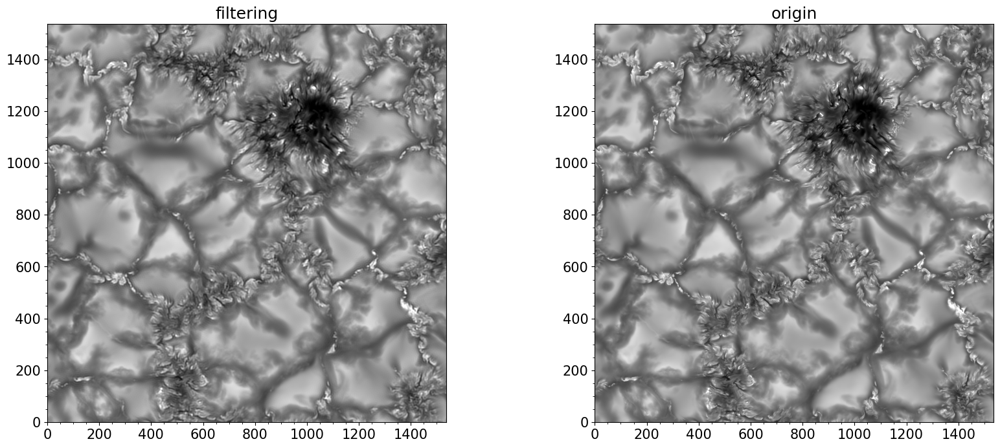

In [9]:
plt.figure(figsize=(20,8))
plt.subplot(121)
plt.imshow(filtered_data.T,origin='lower',cmap='gray',vmin=0.35,vmax=1.65)
plt.title('filtering')
plt.subplot(122)
plt.imshow(stok.stki[100,:,:].T,origin='lower',cmap='gray',vmin=0.35,vmax=1.65)
plt.title('origin')

In [91]:
np.std(filtered_data)

0.18489779263856218

In [92]:
np.std(stok.stki[100,:,:])

0.1901950532357725

Text(0, 0.5, 'origin')

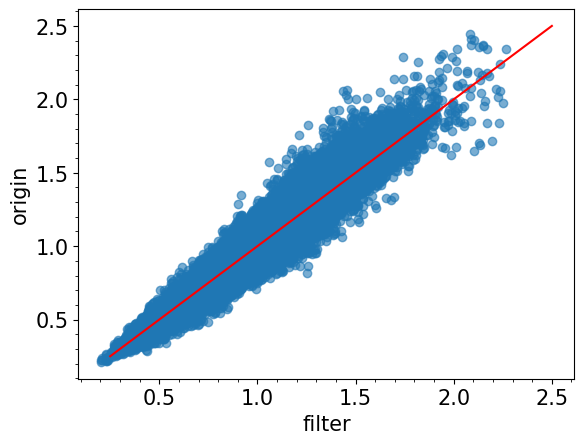

In [6]:
plt.scatter(filtered_data.flatten(),stok.stki[100,:,:].flatten(),alpha=0.6)
plt.plot([0.25,2.5],[0.25,2.5],c='r')
plt.xlabel('filter')
plt.ylabel('origin')

In [111]:
test = fits.open('/dat/xenosh/sharing/prep/stokes_all.fits')[0].data

In [115]:
test.shape

(149, 116, 129, 4, 200)

Text(0.5, 1.0, 'mihi')

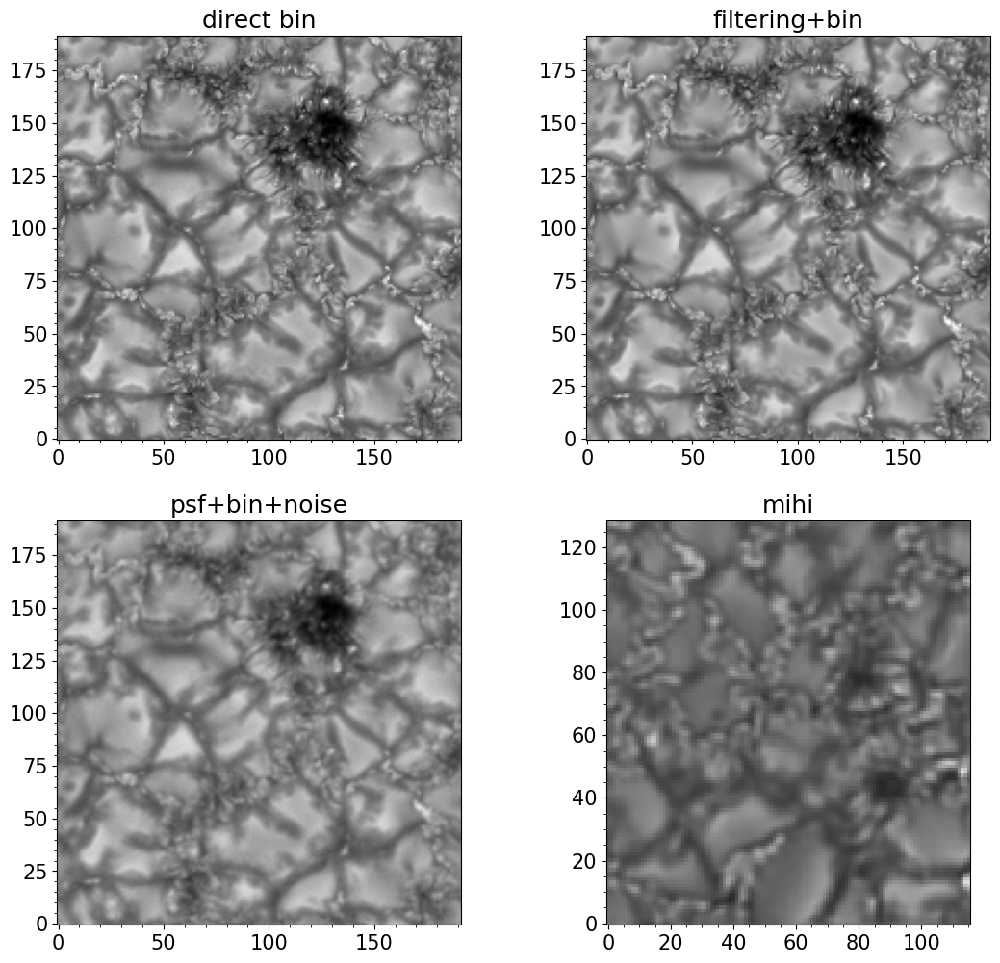

In [117]:
plt.figure(figsize=(13,12))
plt.subplot(222)
plt.imshow(stokes_noise.reshape(1536//8,8,1536//8,8).mean(axis=(1,3))[:,:].T,origin='lower',cmap='gray',vmin=0.35,vmax=1.65)
plt.title('filtering+bin')
plt.subplot(221)
plt.imshow(stokes1.stki[100,:,:].T,origin='lower',cmap='gray',vmin=0.35,vmax=1.65)
plt.title('direct bin')
plt.subplot(223)
plt.imshow(stokes.stki[100,:,:].T,origin='lower',cmap='gray',vmin=0.35,vmax=1.65)
plt.title('psf+bin+noise')
#plt.colorbar()
plt.subplot(224)
plt.imshow(np.mean(test[1,:,:,0,:],axis=2).T,origin='lower',cmap='gray',vmin=0.35,vmax=1.65)
plt.title('mihi')
#plt.colorbar()


Text(0.5, 1.0, 'mihi')

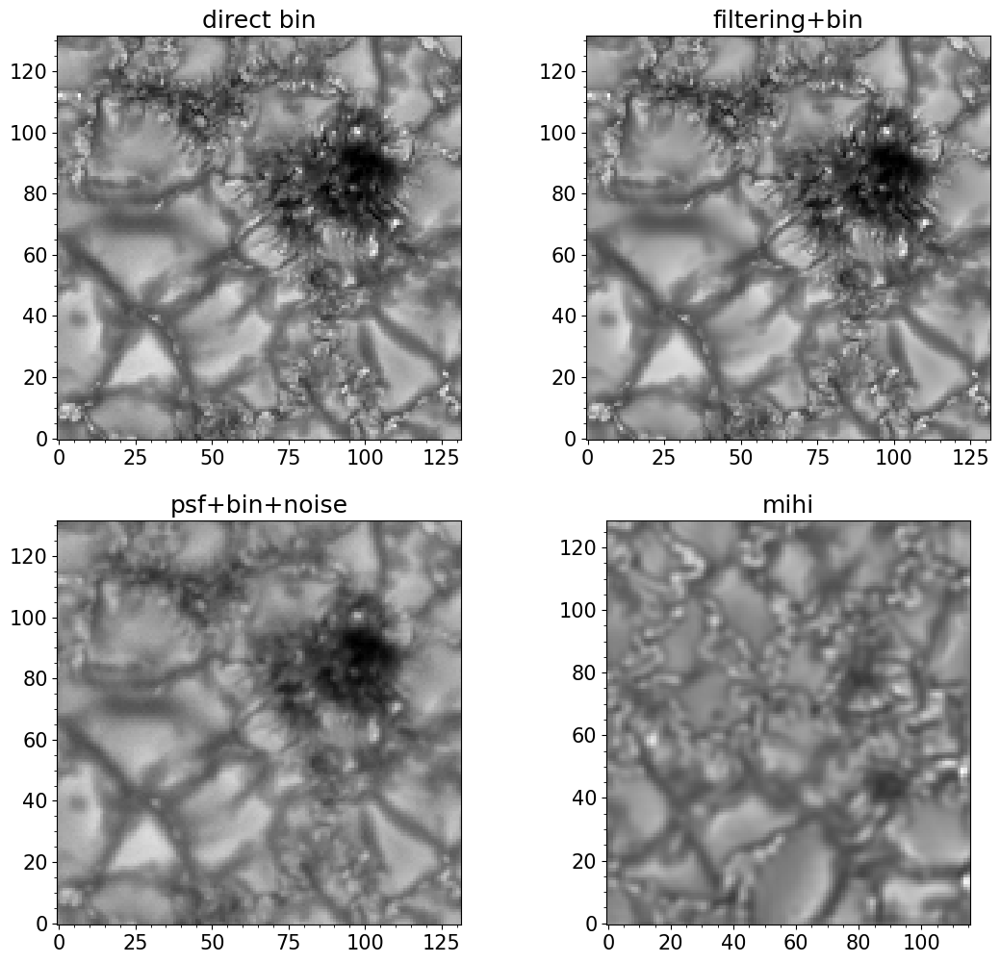

In [ ]:
plt.figure(figsize=(13,12))
plt.subplot(222)
plt.imshow(stokes_noise.reshape(1536//8,8,1536//8,8).mean(axis=(1,3))[30:-30,60:].T,origin='lower',cmap='gray',vmin=0.35,vmax=1.65)
plt.title('filtering+bin')
plt.subplot(221)
plt.imshow(stokes1.stki[100,30:-30,60:].T,origin='lower',cmap='gray',vmin=0.35,vmax=1.65)
plt.title('direct bin')
plt.subplot(223)
plt.imshow(stokes.stki[100,30:-30,60:].T,origin='lower',cmap='gray',vmin=0.35,vmax=1.65)
plt.title('psf+bin+noise')
#plt.colorbar()
plt.subplot(224)
plt.imshow(np.mean(test.stki[185:195,:,:],axis=0).T,origin='lower',cmap='gray',vmin=0.35,vmax=1.65)
plt.title('mihi')
#plt.colorbar()


Text(0, 0.5, 'direct bin')

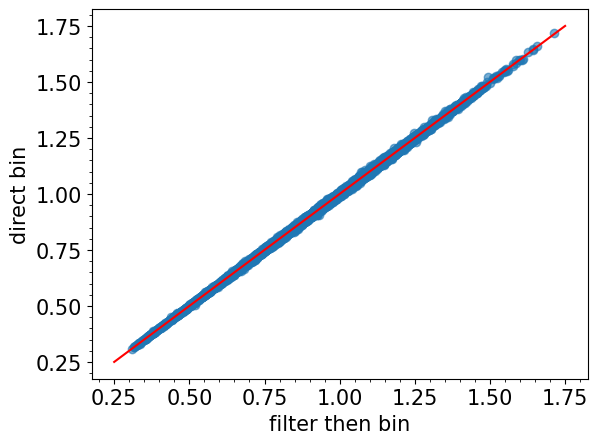

In [107]:
plt.scatter(filtered_data.reshape(1536//8,8,1536//8,8).mean(axis=(1,3)).flatten(),stok.stki[100,:,:].reshape(1536//8,8,1536//8,8).mean(axis=(1,3)).flatten(),alpha=0.6)
plt.plot([0.25,1.75],[0.25,1.75],c='r')
plt.xlabel('filter then bin')
plt.ylabel('direct bin')